# Imports

In [38]:
%reload_ext autoreload
%autoreload 2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import requests
import os
import shutil
import folium
from shapely.geometry import Point, LineString
import matplotlib
from ipywidgets import interact
import seaborn as sns
import math
import stats
import scipy
from dotenv import load_dotenv, find_dotenv
from urllib.parse import urljoin
import requests
from io import StringIO, BytesIO

# Data

In [28]:
## testing remote opening of files
dl_construct = 'https://drive.google.com/uc?export=download&id='
file_id = '1m2BpnJ-NXqlqFW8gYnC_fEI2PLTrXz1r'
# csv = requests.get(f'{dl_construct}{file_id}').content
# memory = BytesIO(csv)
df = gpd.read_file(f'{dl_construct}{file_id}')
df

,Link_ID,linkid,Daily_Aver,Average_Ve,Median_of_,First_Quar,Third_Quar,Func_Class,Speed_Cat,geometry
0,80216819,80216819,6224.778569,45.208716,44.464286,28.000000,59.00,2,6,"MULTILINESTRING ((-9.16402 38.77030, -9.16389 ..."
1,80216858,80216858,2236.054168,79.563308,82.750000,71.750000,93.25,2,4,"MULTILINESTRING ((-9.16645 38.74274, -9.16638 ..."
2,80216859,80216859,2138.725039,65.955069,67.333333,61.000000,75.00,3,6,"MULTILINESTRING ((-9.16645 38.74274, -9.16637 ..."
3,80216860,80216860,2201.335041,47.533911,44.000000,26.900000,74.00,3,6,"MULTILINESTRING ((-9.16588 38.74370, -9.16568 ..."
4,80216867,80216867,2102.610278,51.375291,53.250000,45.333333,59.00,3,6,"MULTILINESTRING ((-9.16472 38.74478, -9.16487 ..."
...,...,...,...,...,...,...,...,...,...,...
34673,1223266734,1223266734,2301.997364,44.392857,43.500000,37.000000,50.00,3,4,"MULTILINESTRING ((-8.53497 41.27065, -8.53505 ..."
34674,1223277122,1223277122,1655.507135,106.848684,109.500000,88.000000,124.00,2,3,"MULTILINESTRING ((-8.46988 41.23316, -8.47069 ..."
34675,1223277123,1223277123,1665.608140,108.863821,114.250000,90.000000,124.50,2,3,"MULTILINESTRING ((-8.47069 41.23324, -8.47099 ..."
34676,1223277124,1223277124,2580.645483,104.774517,108.375000,94.200000,122.00,2,3,"MULTILINESTRING ((-8.47747 41.23388, -8.47775 ..."


In [2]:
# importing all files including the shapes
geo = gpd.read_file('wdl_data/m_risk_prfile.geojson')
df = pd.DataFrame(geo).drop(columns=['geometry', 'Link_ID'])

In [5]:
## Filtering only lisbon data at 38.72526068747401, -9.142352617846093
circle_lisbon = Point(-9.142352617846093, 38.72526068747401).buffer(1)
geo_lis = geo[geo.geometry.within(circle_lisbon)]
df_lis = pd.DataFrame(geo_lis).drop(columns=['geometry', 'Link_ID'])

In [6]:
p = list(geo_lis['geometry'][0])

In [7]:
# defining a comparable center point to target to the weather API
def get_center(geo):
    geo.loc[:,'center'] = None
    for c, row in geo.iterrows():
        coords = row['geometry'][0].coords.xy
        l = len(coords[0])
        half = math.ceil(l/2)
        center = (coords[0][half], coords[1][half])
        geo.loc[c, 'center'] = [[center]]

In [8]:
get_center(geo_lis)

/Users/moritzgeiger/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)
/Users/moritzgeiger/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/moritzgeiger/.pyenv/versions/3.8.6/envs/lewagon/lib/python3.8/site-packages/pandas/core/ind

# Weather

**Note**<br>
The provided OpenWeatherAPI doesn't give precice enough historical information to implement on our data set of road sequences. A few attempts were made below, but all requests reach to the same results due to a generalized City ID for all requests. 

## Yearly aggregated numbers

In [9]:
# geo_lis

In [16]:
load_dotenv(find_dotenv())
OWM_API = os.environ.get("OWM_API")

In [17]:
req = 'https://history.openweathermap.org/data/2.5/aggregated/year'
resps = []

for c, row in geo_lis.sample(20).iterrows():
    lat = row['center'][0][0]
    lon = row['center'][0][1]
    params = {
    'lat': lat,
    'lon': lon,
#     'type':'hour',
#     'start': '1619427667',
#     'cnt': ,
    'appid':OWM_API
    }
    r = requests.get(req, params=params)
    print(r)
    resps.append(r.json())





<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>


In [18]:
resps

[{'cod': 200,
  'city_id': 160263,
  'calctime': 6.038851625,
  'result': [{'month': 1,
    'day': 1,
    'temp': {'record_min': 295.45,
     'record_max': 306.85,
     'average_min': 298.13,
     'average_max': 304.09,
     'median': 300.67,
     'mean': 301.05,
     'p25': 299.35,
     'p75': 303.09,
     'st_dev': 2.55,
     'num': 216},
    'pressure': {'min': 1005,
     'max': 1022,
     'median': 1013,
     'mean': 1013.94,
     'p25': 1011,
     'p75': 1018,
     'st_dev': 4.3,
     'num': 216},
    'humidity': {'min': 55,
     'max': 100,
     'median': 82,
     'mean': 80.95,
     'p25': 74,
     'p75': 91.5,
     'st_dev': 12.47,
     'num': 216},
    'wind': {'min': 1.17,
     'max': 10.3,
     'median': 3.41,
     'mean': 3.97,
     'p25': 2.56,
     'p75': 5.1,
     'st_dev': 1.86,
     'num': 216},
    'precipitation': {'min': 0,
     'max': 0.9,
     'median': 0,
     'mean': 0.04,
     'p25': 0,
     'p75': 0,
     'st_dev': 0.14,
     'num': 216},
    'clouds': {'min':

In [19]:
df_weather = pd.DataFrame(resps)

In [20]:
df_weather.result[0] == df_weather.result[15] == df_weather.result[10] == df_weather.result[19]
# Turns out, the granularity of the data is based on the city. all the responsed for different coordinates are the same

True

## Percipitation

In [21]:
url = 'http://history.openweathermap.org/data/2.5/history/accumulated_precipitation'
resps = []

for c, row in geo_lis.sample(10).iterrows():
    lat = row['center'][0][0]
    lon = row['center'][0][1]
    params = {
    'lat': lat,
    'lon': lon,
#     'type':'hour',
    'start': '1609675523',
    'end': '1609848323',
    'appid':OWM_API
    }
    r = requests.get(url, params=params)
    resps.append(r.json())


In [22]:
df_weather = pd.DataFrame(resps)

In [23]:
df_weather

,message,cod,city_id,calctime,list
0,", tm1=0.002189",200,160263,0.005331,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."
1,", tm1=0.002079",200,160263,0.004893,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."
2,", tm1=0.002446",200,160263,0.005327,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."
3,", tm1=0.003449",200,160263,0.006163,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."
4,", tm1=0.002638",200,160263,0.005834,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."
5,", tm1=0.002454",200,160263,0.005509,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."
6,", tm1=0.002132",200,160263,0.005271,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."
7,", tm1=0.002279",200,160263,0.005109,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."
8,", tm1=0.002172",200,160263,0.004840,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."
9,", tm1=0.003396",200,160263,0.007595,"[{'date': '2021-1-3', 'rain': 0.9, 'count': 1}..."


In [24]:
df_weather.list[0] == df_weather.list[5] == df_weather.list[7] == df_weather.list[9]


True

## Weather map

In [25]:
load_dotenv(find_dotenv())
HERE_API = os.environ.get("HERE_API")

In [30]:
# first find tiles
def get_tiles(link_id):
    ## going to index API for tileXYs
    print(f'finding coordinates for linkid: {link_id}')
    base_url = 'https://fleet.ls.hereapi.com/'
    endpoint_index = '1/index.json'
    params_i = {'layer':'ROAD_GEOM_FCn',
              'attributes':'LINK_ID',
              'values':f'{link_id}',
              'apiKey':HERE_API}
    ri = requests.get(url=urljoin(base_url,endpoint_index), params=params_i)
    if ri.status_code == 200:
        try: 
            layers = ri.json().get('Layers')[0]
            layer = layers.get('layer', None)
            level = layers.get('level', None)
            tileXYs = layers.get('tileXYs', None)[0]
            print(f'found these tiles: {tileXYs}')
            return level, tileXYs
        except Exception as e:
            print(f'sth went wrong with this response: {ri.content}, error: {e}')
            return None
    else:
        print(f'couldnt find distance. Code: {ri.status_code}, error: {ri.content}')
        return None

In [36]:
level, tileXYs = get_tiles(80216860)

finding coordinates for linkid: 80216860
found these tiles: {'x': 1943, 'y': 1464}


In [37]:
ma = f'https://maps.openweathermap.org/maps/2.0/radar/{level}/{tileXYs["x"]}/{tileXYs["x"]}?'
# for c, row in geo_lis.sample(10).iterrows():
params = {
'tm': '1619353200',
'appid':OWM_API
}
    
r = requests.get(ma, params=params)

In [40]:
r

<Response [404]>

In [38]:
ma

'https://maps.openweathermap.org/maps/2.0/radar/11/1943/1943?'

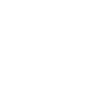

In [45]:
geo_lis.geometry[0]

# Calculate distance from point to line

In [19]:
def dist(point, line):
    return line.distance(point) < .01

In [20]:
point = Point(-9.16594, 38.75732)
line = geo_lis['geometry'][0]
dist(point, line), line[0].coords.xy

(False,
 (array('d', [-9.16402, -9.16389, -9.1638]),
  array('d', [38.7703, 38.77066, 38.77095])))

In [22]:
type(point)

shapely.geometry.point.Point